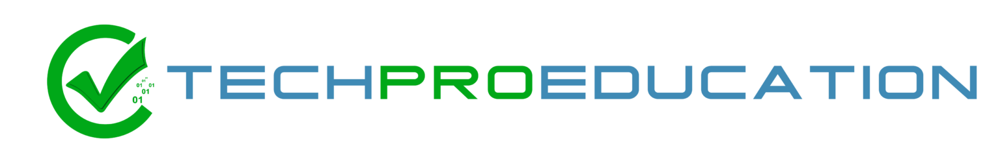

#  Hand Written Digits Project

In [1]:
# EDA için kütüphaneler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

# Grafikleri göstermek için
%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 6

# Makine öğrenmesi algoritmaları, veri ön işleme ve değerlendirme için sklearn kütüphanesi
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, auc

# Uyarılardan kurtulmak için
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

In [2]:
df = pd.read_csv('pendigits_txt.csv')
df_copy = df.copy()
df

,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,input11,input12,input13,input14,input15,input16,class
0,47,100,27,81,57,37,26,0,0,23,56,53,100,90,40,98,8
1,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
2,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
3,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
4,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10987,36,100,24,70,0,38,49,33,95,47,87,55,96,21,100,0,4
10988,16,75,41,100,52,64,32,27,0,0,21,9,62,2,100,14,2
10989,56,100,27,79,0,39,12,0,66,15,100,51,93,93,38,93,0
10990,19,100,0,61,3,23,48,0,97,27,100,66,62,97,10,81,0


# Exploratory Data Analysis and Visualization

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10992 entries, 0 to 10991
Data columns (total 17 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   input1   10992 non-null  int64
 1   input2   10992 non-null  int64
 2   input3   10992 non-null  int64
 3   input4   10992 non-null  int64
 4   input5   10992 non-null  int64
 5   input6   10992 non-null  int64
 6   input7   10992 non-null  int64
 7   input8   10992 non-null  int64
 8   input9   10992 non-null  int64
 9   input10  10992 non-null  int64
 10  input11  10992 non-null  int64
 11  input12  10992 non-null  int64
 12  input13  10992 non-null  int64
 13  input14  10992 non-null  int64
 14  input15  10992 non-null  int64
 15  input16  10992 non-null  int64
 16  class    10992 non-null  int64
dtypes: int64(17)
memory usage: 1.4 MB


In [4]:
def summary(df, pred=None):
    obs = df.shape[0]
    Types = df.dtypes
    Counts = df.apply(lambda x: x.count())
    Min = df.min()  #min max method lari butun sutunlar icin ayri ayri degerler dondurur
    Max = df.max()
    Uniques = df.apply(lambda x: x.unique().shape[0])
    Nulls = df.apply(lambda x: x.isnull().sum())  #apply tek tek df in sutunlarini alir ve islmei uygular
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        df_pict = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    df_pict.columns = cols
    print('___________________________\nData Types:')
    print(df_pict.Types.value_counts())
    print('___________________________')
    return df_pict

In [5]:
summary(df)

Data shape: (10992, 17)
___________________________
Data Types:
int64    17
Name: Types, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
class,int64,10992,10,0,0,9
input1,int64,10992,101,0,0,100
input10,int64,10992,101,0,0,100
input11,int64,10992,101,0,0,100
input12,int64,10992,101,0,0,100
input13,int64,10992,101,0,0,100
input14,int64,10992,101,0,0,100
input15,int64,10992,101,0,0,100
input16,int64,10992,101,0,0,100
input2,int64,10992,96,0,0,100


In [6]:
df.corr()

,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,input11,input12,input13,input14,input15,input16,class
input1,1.000000,0.347763,0.280842,0.119645,-0.439896,-0.103732,-0.367140,-0.102077,-0.038296,-0.102762,0.189202,-0.106069,0.135265,-0.022685,-0.358122,0.034411,0.352199
input2,0.347763,1.000000,-0.080164,0.214167,-0.310583,-0.255377,-0.320403,-0.383218,-0.080932,-0.306630,0.144516,-0.023232,0.134331,0.124136,-0.134720,0.127604,0.232075
input3,0.280842,-0.080164,1.000000,0.442439,0.416487,0.456945,-0.190123,0.295910,-0.144281,-0.036834,-0.022503,-0.463429,-0.162873,-0.472660,-0.179291,-0.315304,0.243030
input4,0.119645,0.214167,0.442439,1.000000,0.194851,0.675734,-0.036291,0.269129,-0.156279,-0.282295,-0.181192,-0.732677,-0.089374,-0.647705,0.114119,-0.385121,0.183646
input5,-0.439896,-0.310583,0.416487,0.194851,1.000000,0.464945,0.428410,0.356024,-0.223791,0.049201,-0.323276,-0.308267,-0.340178,-0.281341,0.052736,-0.125011,0.039919
input6,-0.103732,-0.255377,0.456945,0.675734,0.464945,1.000000,0.185721,0.779892,-0.036021,0.155711,-0.150013,-0.632538,-0.181143,-0.794761,0.093721,-0.598063,0.153520
input7,-0.367140,-0.320403,-0.190123,-0.036291,0.428410,0.185721,1.000000,0.379678,0.437459,0.354902,-0.161516,0.099955,-0.371791,-0.080724,0.035337,-0.102561,-0.123090
input8,-0.102077,-0.383218,0.295910,0.269129,0.356024,0.779892,0.379678,1.000000,0.295293,0.650526,0.113682,-0.237330,-0.128662,-0.719883,-0.133502,-0.711123,0.108829
input9,-0.038296,-0.080932,-0.144281,-0.156279,-0.223791,-0.036021,0.437459,0.295293,1.000000,0.533213,0.603845,0.291837,-0.067068,-0.097271,-0.390861,-0.268439,-0.170221
input10,-0.102762,-0.306630,-0.036834,-0.282295,0.049201,0.155711,0.354902,0.650526,0.533213,1.000000,0.389667,0.474586,0.023574,-0.215487,-0.335933,-0.454487,-0.044632


In [7]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

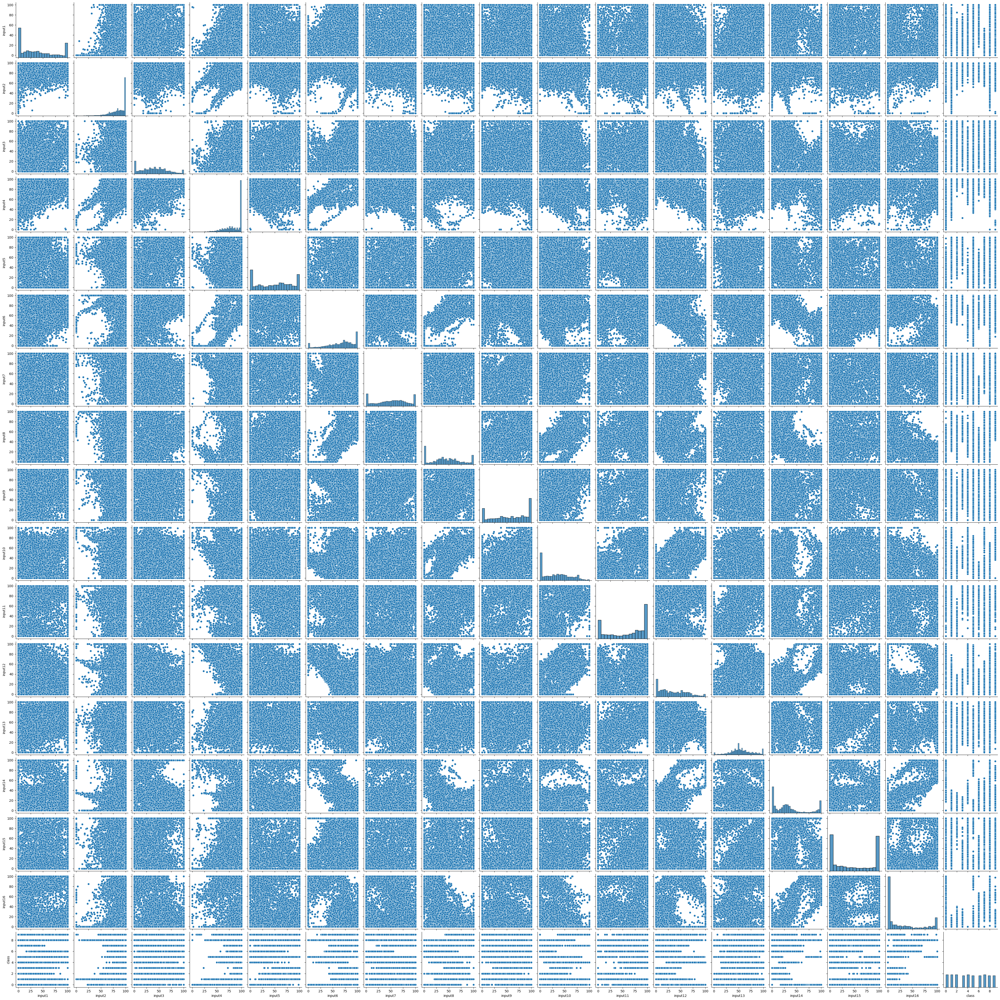

In [8]:
sns.pairplot(df)

# Random Forest Classifier

In [9]:
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier()

In [13]:
X=df.drop(["class"], axis=1)
y=df["class"]

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20,shuffle=False, random_state=42)

In [16]:
X_train

,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,input11,input12,input13,input14,input15,input16
0,47,100,27,81,57,37,26,0,0,23,56,53,100,90,40,98
1,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6
2,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0
3,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0
4,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8788,1,64,29,100,34,79,28,32,0,1,8,0,54,2,100,2
8789,88,100,65,83,33,54,0,30,65,27,100,48,98,31,94,0
8790,67,96,7,83,66,56,100,23,34,0,0,30,24,68,24,100
8791,0,96,45,100,60,66,55,31,40,0,11,30,45,48,100,56


In [17]:
rf_model.fit(X_train,y_train)

RandomForestClassifier()

In [18]:
y_pred_rf = rf_model.predict(X_test)

In [21]:
from sklearn.metrics import classification_report,confusion_matrix

In [22]:
eval_metric(rf_model,X_train,y_train,X_test,y_test)

Test_Set
[[219   0   0   0   0   0   0   0   2   0]
 [  0 217  11   0   0   0   0   1   0   0]
 [  0   2 223   0   0   0   0   0   0   0]
 [  0   0   0 219   0   0   0   0   0   0]
 [  0   0   0   0 242   0   0   0   0   0]
 [  0   0   0   3   0 205   0   0   0   2]
 [  0   0   0   0   0   0 210   0   0   0]
 [  0   3   0   0   0   0   1 218   0   0]
 [  0   0   0   0   0   0   0   0 199   0]
 [  0   1   0   0   0   0   0   2   1 218]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       221
           1       0.97      0.95      0.96       229
           2       0.95      0.99      0.97       225
           3       0.99      1.00      0.99       219
           4       1.00      1.00      1.00       242
           5       1.00      0.98      0.99       210
           6       1.00      1.00      1.00       210
           7       0.99      0.98      0.98       222
           8       0.99      1.00      0.99       199
           9       

In [27]:
from sklearn.model_selection import cross_val_score
accuracy_score = cross_val_score(rf_model,X_train,y_train,cv=10)
accuracy_score.mean()

0.9889670596752509

# Support Vector Machine (SVM) Classifier

In [28]:
from sklearn.model_selection import train_test_split

In [29]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix

In [30]:
X=df.drop(["class"], axis=1)
y=df["class"]

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)

In [32]:
svm_model = SVC(random_state=42)
svm_model.fit(X_train, y_train)
eval_metric(svm_model, X_train, y_train, X_test, y_test)

Test_Set
[[229   0   0   0   0   0   0   0   0   0]
 [  0 219   5   3   0   0   0   2   0   0]
 [  0   1 227   0   0   0   0   1   0   0]
 [  0   0   1 209   0   0   0   1   0   0]
 [  0   0   0   0 226   2   0   1   0   0]
 [  0   0   0   2   0 209   0   0   0   0]
 [  0   0   0   0   0   0 211   0   0   0]
 [  0   0   0   0   0   0   0 228   0   0]
 [  0   0   0   0   0   0   0   0 211   0]
 [  0   0   0   0   0   0   0   1   0 210]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       229
           1       1.00      0.96      0.98       229
           2       0.97      0.99      0.98       229
           3       0.98      0.99      0.98       211
           4       1.00      0.99      0.99       229
           5       0.99      0.99      0.99       211
           6       1.00      1.00      1.00       211
           7       0.97      1.00      0.99       228
           8       1.00      1.00      1.00       211
           9       

In [33]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [34]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(random_state=42))]
pipe_model = Pipeline(steps=operations)

In [35]:
pipe_model.fit(X_train, y_train)
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[229   0   0   0   0   0   0   0   0   0]
 [  0 221   3   3   0   0   0   2   0   0]
 [  0   1 227   0   0   0   0   1   0   0]
 [  0   0   1 209   0   0   0   1   0   0]
 [  0   0   0   0 229   0   0   0   0   0]
 [  0   0   0   2   0 209   0   0   0   0]
 [  0   0   0   0   0   0 211   0   0   0]
 [  0   0   0   0   0   0   0 228   0   0]
 [  0   0   0   0   0   0   0   0 211   0]
 [  0   1   0   0   0   0   0   1   0 209]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       229
           1       0.99      0.97      0.98       229
           2       0.98      0.99      0.99       229
           3       0.98      0.99      0.98       211
           4       1.00      1.00      1.00       229
           5       1.00      0.99      1.00       211
           6       1.00      1.00      1.00       211
           7       0.98      1.00      0.99       228
           8       1.00      1.00      1.00       211
           9       

In [36]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(C= 0.05, gamma= 0.3, kernel= 'linear', probability=True, 
                                                        class_weight="balanced", random_state=42))]
model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy
1,2.236144,0.093742,0.981818
2,2.031107,0.093743,0.977273
3,2.031114,0.093743,0.976136
4,2.046731,0.093746,0.973834
5,2.062372,0.093743,0.981797
6,2.093605,0.093744,0.974972
7,2.093594,0.093745,0.965870
8,2.133312,0.093743,0.969283
9,2.048393,0.078118,0.980660
10,2.077967,0.093743,0.980660


In [37]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [38]:
svm_model = SVC(random_state=42)
svm_model.fit(X_train, y_train)
eval_metric(svm_model, X_train, y_train, X_test, y_test)

Test_Set
[[229   0   0   0   0   0   0   0   0   0]
 [  0 221   3   3   0   0   0   2   0   0]
 [  0   1 227   0   0   0   0   1   0   0]
 [  0   0   1 209   0   0   0   1   0   0]
 [  0   0   0   0 229   0   0   0   0   0]
 [  0   0   0   2   0 209   0   0   0   0]
 [  0   0   0   0   0   0 211   0   0   0]
 [  0   0   0   0   0   0   0 228   0   0]
 [  0   0   0   0   0   0   0   0 211   0]
 [  0   1   0   0   0   0   0   1   0 209]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       229
           1       0.99      0.97      0.98       229
           2       0.98      0.99      0.99       229
           3       0.98      0.99      0.98       211
           4       1.00      1.00      1.00       229
           5       1.00      0.99      1.00       211
           6       1.00      1.00      1.00       211
           7       0.98      1.00      0.99       228
           8       1.00      1.00      1.00       211
           9       

# Conclusion

Her iki modelde de yaklasik ayni skorlar alinmistir.
RF daha kisa surede sonuc verdiginden zaman tasarrufu acisindan RF tercih edilmektedir

Github repo : https://github.com/euphratesk/DS.git